# Visualization

This quick tutorial introduces the key concepts and basic features of visualization.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sportslabkit as slk

root = slk.utils.get_git_root()
dataset_path = slk.datasets.get_path('wide_view')
path_to_csv = sorted(dataset_path.glob('annotations/*.csv'))[0]
path_to_mp4 = sorted(dataset_path.glob('videos/*.mp4'))[0]

bbdf = slk.load_df(path_to_csv)
bbdf.head()

TeamID           0                                                           \
PlayerID         1                                      10                    
Attributes bb_left bb_top bb_width bb_height conf  bb_left  bb_top bb_width   
frame                                                                         
0           3543.0  607.0     30.0      52.5  1.0  3536.42  555.93    13.57   
1           3542.0  609.0     32.0      51.0  1.0  3536.13  555.96    13.66   
2           3542.0  611.0     32.0      50.0  1.0  3535.85  555.99    13.73   
3           3542.0  613.0     32.0      49.0  1.0  3535.57  556.02    13.80   
4           3539.0  615.0     36.0      46.0  1.0  3535.28  556.04    13.88   

TeamID                     ...        1                                  \
PlayerID                   ...        9                                   
Attributes bb_height conf  ...  bb_left  bb_top bb_width bb_height conf   
frame                      ...                                            
0              42.39  1.0  ...  2919.31  538.44    23.59     47.18  1.0   
1              42.27  1.0  ...  2919.44  538.55    23.59     47.18  1.0   
2              42.16  1.0  ...  2919.57  538.66    23.59     47.18  1.0   
3              42.04  1.0  ...  2919.70  538.77    23.59     47.18  1.0   
4              41.94  1.0  ...  2919.84  538.88    23.59     47.18  1.0   

TeamID            3                                  
PlayerID          0                                  
Attributes  bb_left  bb_top bb_width bb_height conf  
frame                                                
0           3542.77  549.47      6.4       7.0  1.0  
1           3548.55  549.43      6.4       7.0  1.0  
2           3554.32  549.40      6.4       7.0  1.0  
3           3560.10  549.36      6.4       7.0  1.0  
4           3565.87  549.33      6.4       7.0  1.0  

[5 rows x 115 columns]

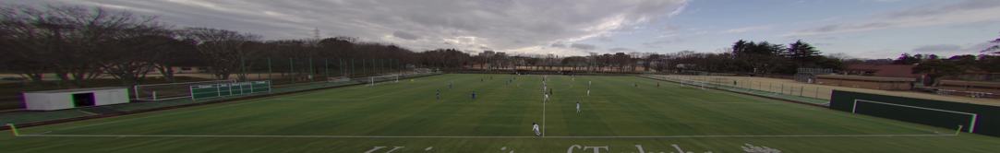

In [3]:
from sportslabkit.utils import cv2pil

cam = slk.Camera(path_to_mp4)
frame = cam.get_frame(1)

h, w = frame.shape[:2]
cv2pil(frame, convert_bgr2rgb=False).resize((w//6, h//6))

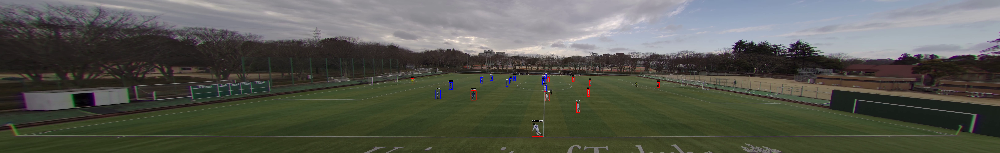

In [4]:
from sportslabkit.viz import SimpleVisualizer

visualizer = SimpleVisualizer()
image = visualizer.draw_frame(bbdf.get_frame(0), frame)

cv2pil(image, convert_bgr2rgb=False)

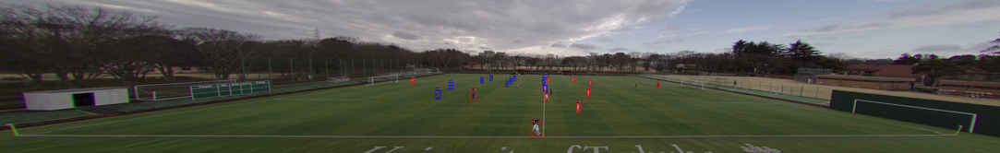

In [5]:
image = bbdf.visualize_frame(1, frame)
cv2pil(image, convert_bgr2rgb=False).resize((w//6, h//6))

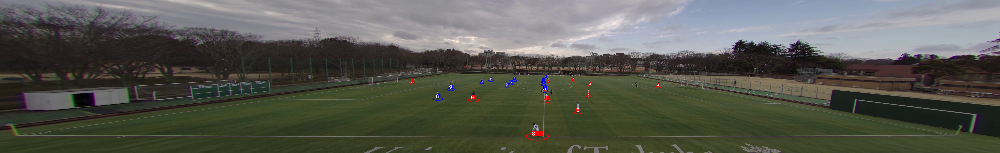

In [6]:
from sportslabkit.viz import FancyVisualizer

visualizer = FancyVisualizer()
image = visualizer.draw_frame(bbdf.get_frame(0), frame)

cv2pil(image, convert_bgr2rgb=False)

## Drawing Functions

In [7]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


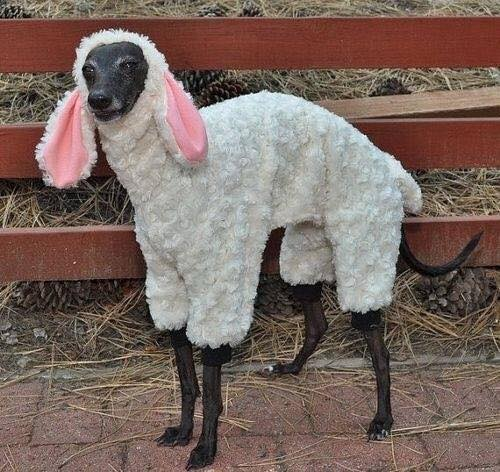

In [8]:
import cv2
from sportslabkit.utils import cv2pil

image = cv2.imread('./assets/cat.jpeg')
cv2pil(image)

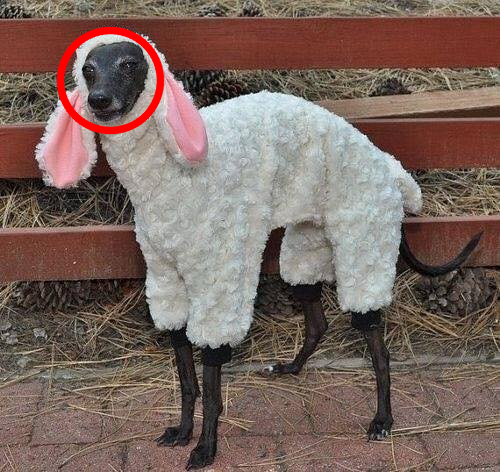

In [9]:
from sportslabkit.types import Point, Color, Rect
from sportslabkit.viz.visualization import draw_circle

point = Point(110, 80)
color = Color(255, 0, 0)

imc = image.copy()
draw_circle(imc, center=point, radius=50, color=color, thickness=5)
cv2pil(imc)

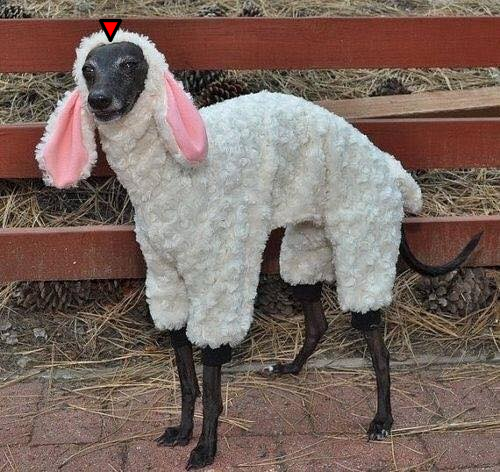

In [10]:
from sportslabkit.viz.visualization import draw_marker

imc = image.copy()

draw_marker(imc, anchor=point, color=color, marker_width=20, marker_height=20, marker_margin=40)
cv2pil(imc)

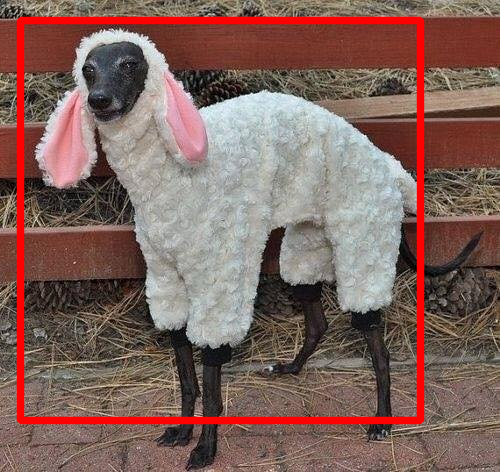

In [11]:
from sportslabkit.viz.visualization import draw_rect

imc = image.copy()
box = Rect(20, 20, 400, 400)
draw_rect(imc, box, color=color, thickness=5)
cv2pil(imc)

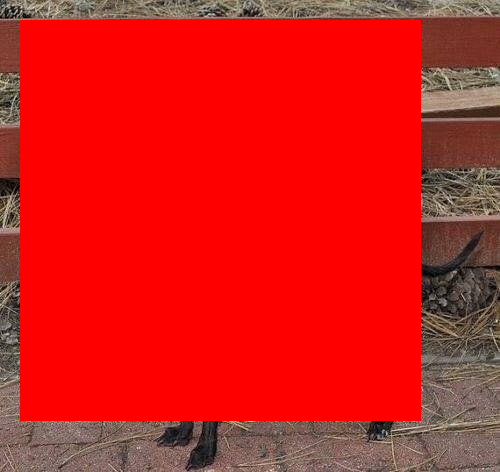

In [12]:
from sportslabkit.viz.visualization import draw_filled_rect

imc = image.copy()
draw_filled_rect(imc, box, color=color)
cv2pil(imc)

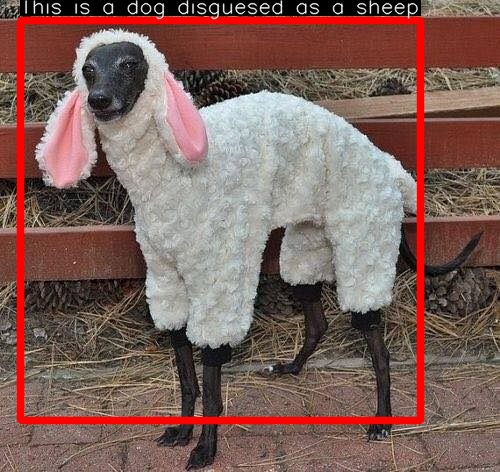

In [13]:
from sportslabkit.viz.visualization import draw_rect_with_caption

caption = "This is a dog disguesed as a sheep"
imc = image.copy()
draw_rect_with_caption(imc, box, caption=caption, color=color, thickness=5)
cv2pil(imc)